In [1]:
# Импортируем нужные модули
from urllib.request import urlretrieve
import vk, os, time, math
import pandas as pd
import datetime
import networkx as nx
import scipy
from tqdm import tqdm
import matplotlib.pyplot as plt

access_token = ''
with open('credits.bin', 'rb') as file:
    access_token = file.read().decode()

In [2]:
# Создать датафрейм по сырым даннымЫ
def create_df(raw_users):
    struct_users = []
    for user in raw_users:
        first_name = None
        try:
            first_name = user['first_name']
        except Exception:
            pass
        last_name = None
        try:
            last_name = user['last_name']
        except Exception:
            pass
        city = None
        try:
            city = user['city']['title']
        except Exception:
            pass
        country = None
        try:
            country = user['country']['title']
        except Exception:
            pass
        sex = None
        try:
            if user['sex'] == 1:
                sex = 'W'
            elif user['sex'] == 2:
                sex = 'M'
        except Exception:
            pass
        age = None
        status = None
        try:
            status = 'online' if user['sex'] == 1 else 'offline'
        except Exception:
            pass
        try:
            date = datetime.datetime.strptime(user['bdate'], '%d.%m.%Y')
            age = (datetime.date.today() - date.date()) // datetime.timedelta(days=365.2425)
        except Exception:
            pass
        struct_users.append([first_name, last_name, age, sex, city, country, status])
    df = pd.DataFrame(struct_users, columns=['first_name', 'last_name', 'age', 'sex', 'city', 'country', 'status'])
    return df

# Достать id из результата запроса
def get_ids(raw_users):
    ids = []
    for user in raw_users:
        ids.append(user['id'])
    return ids

# Получить друзей заданного пользователя
def load_friends(id):
    raw_friends = vkapi.friends.get(user_id=id)
    return raw_friends['items']

# Генерация ребер (друг-друг)
def create_edges(users_df):
    user_friends = {}
    private_users = 0

    for user in tqdm(list(users_df['id'])):
        try:
            current_user_friends = load_friends(user)
            if user not in user_friends:
                user_friends[user] = set()
            for friend in current_user_friends:
                if friend in list(users_df['id']):
                    if friend not in user_friends:
                        user_friends[friend] = set()
                    user_friends[user].add(friend)
                    user_friends[friend].add(user)
        except Exception:
            private_users += 1

    vertices = []
    for V, E in user_friends.items():
        for e in E:
            if [e, V] not in vertices:
                vertices.append([V, e])
    print("Private users: " + str(private_users))
    return pd.DataFrame({'first': [i[0] for i in vertices], 'second': [i[1] for i in vertices]})

# Разделение вершин по цветам (2 цвета - 2 группы)
def create_colors(Graph, irbis_ids):
    ids = []
    colors = []
    for id in Graph.nodes():
        ids.append(id)
        color = 'purple'
        if id in list(irbis_ids['id']):
            color = 'red'
        colors.append(color)

    # Сопоставление с индексами
    index_to_color = pd.DataFrame({'ID':ids, 'colors':colors })
    index_to_color = index_to_color.set_index('ID')
    index_to_color = index_to_color.reindex(Graph.nodes())
    return index_to_color['colors']

In [3]:
# 1. Загрузка фотографий всех альбомов
# Авторизация
vkapi = vk.API(access_token=access_token, v='5.81')

# Группа ВШЭ
hse_group_URL = 'https://vk.com/hseofficial'
hse_short_name = hse_group_URL.split('/')[-1]
hse_owner_id = vkapi.groups.getById(group_id=hse_short_name)[0]['id']
hse_album_ids = vkapi.photos.getAlbums(owner_id=-hse_owner_id)

# Генерация папок
if not os.path.exists('HSE_Albums'):
    os.mkdir('HSE_Albums')
for idict in hse_album_ids['items']:
    album = 'HSE_Albums/album-{0}_{1}'.format(hse_owner_id, idict['id'])
    if not os.path.exists(album):
        os.mkdir(album)

count = 0 # текущий счетчик
photos_count = 0 # все фотографии всех альбомов
prog = 0 # процент загруженных
breaked = 0 # не загружено из-за ошибки

# Количество всех фотографий
for idict in hse_album_ids['items']:
    photos_count += idict['size']

time_now = time.time() # время старта
for idict in hse_album_ids['items']:
    photos = vkapi.photos.get(owner_id=-hse_owner_id, album_id=idict['id'], count=1000)
    for photo in photos['items']:
        count += 1
        print('Загружаю фото №{} из {}. Прогресс: {} %'.format(count, photos_count, round(100/photos_count*count, 2)), end="")
        print("\r", end="")
        # Последняя фотография с оригинальным разрешением
        original_resolution_url = photo["sizes"][len(photo["sizes"]) - 1]['url']
        try:
            split_url = os.path.split(original_resolution_url)[1]
            file_name = split_url[:split_url.find('.jpg')+4]
            urlretrieve(original_resolution_url, 'HSE_Albums/album-{0}_{1}/{2}'.format(hse_owner_id, idict['id'], file_name))
        except Exception as e:
            print('Произошла ошибка, файл пропущен. ',)
            breaked += 1
            continue

time_for_dw = time.time() - time_now
print("\nВ очереди было {} файлов. Из них удачно загружено {} файлов, {} не удалось загрузить. Затрачено времени: {} сек.". format(photos_count, photos_count-breaked, breaked, round(time_for_dw,1)))

Загружаю фото №240 из 240. Прогресс: 100.0 %
В очереди было 240 файлов. Из них удачно загружено 240 файлов, 0 не удалось загрузить. Затрачено времени: 46.1 сек.


In [4]:
# 2. Исследование 2 групп

# ОДП "Ирбис"
irbis_url = 'https://vk.com/odp_irbis'

# ССервО "Комильфо"
komilfo_url = 'https://vk.com/so_komilfo'

# Авторизация
vkapi = vk.API(access_token=access_token, v='5.81')

# Сообщество по имени
irbis = vkapi.groups.getById(group_id=os.path.split(irbis_url)[1])
komilfo = vkapi.groups.getById(group_id=os.path.split(komilfo_url)[1])

# Пользователи
irbis_members = vkapi.groups.getMembers(group_id=irbis[0]['id'])
komilfo_members = vkapi.groups.getMembers(group_id=komilfo[0]['id'])

# Данные о пользователях групп
raw_irbis_users = vkapi.users.get(user_ids=irbis_members['items'], fields='sex, city, bdate, country, online')
raw_komilfo_users = vkapi.users.get(user_ids=komilfo_members['items'], fields='sex, city, bdate, country, online')

# Датафреймы по пользователям
irbis_df = create_df(raw_irbis_users)
komilfo_df = create_df(raw_komilfo_users)

                     Распределение подписчиков по возрастам                     


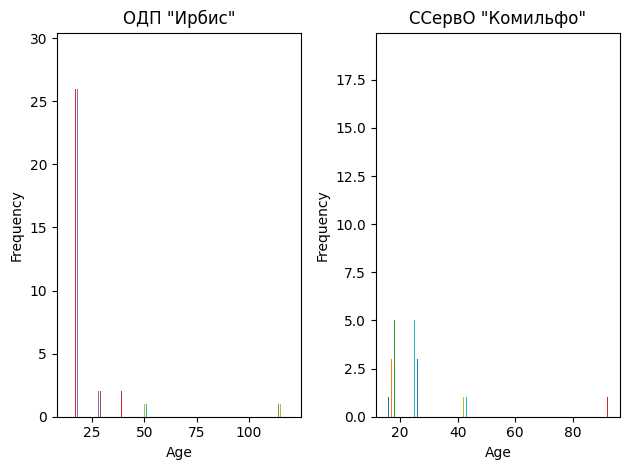

In [5]:
# Распределение подписчиков групп по возрастам
print("Распределение подписчиков по возрастам".center(80))

plt.figure()
plt.subplot(1,2,1)
plt.xlabel('Age')
irbis_df.groupby('age').age.plot(kind='hist', title='ОДП "Ирбис"')
plt.subplot(1,2,2)
plt.xlabel('Age')
komilfo_df.groupby('age').age.plot(kind='hist', title='ССервО "Комильфо"')
plt.tight_layout()
plt.show()

             Распределение подписчиков по полу              


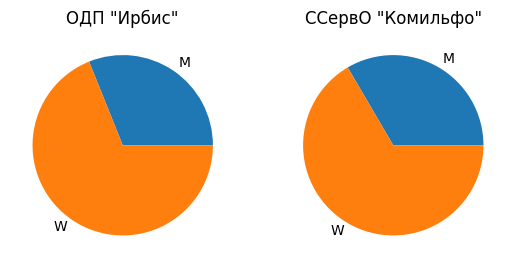

In [6]:
# Распределение подписчков групп по полу
print("Распределение подписчиков по полу".center(60))

plt.figure()
plt.subplot(1,2,1)
irbis_df.groupby(['sex']).size().plot( kind='pie', title='ОДП "Ирбис"')
plt.subplot(1,2,2)
komilfo_df.groupby(['sex']).size().plot( kind='pie', title='ССервО "Комильфо"')
plt.show()

                 Распределение подписчиков по странам                 


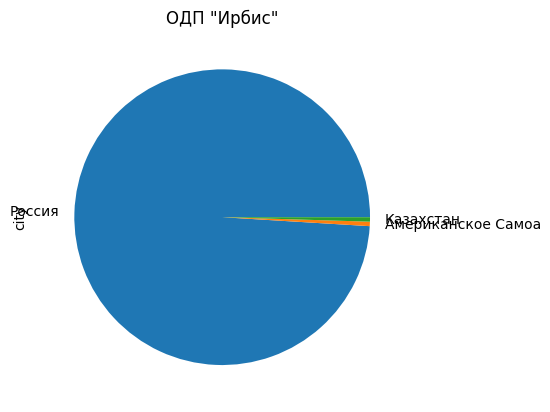

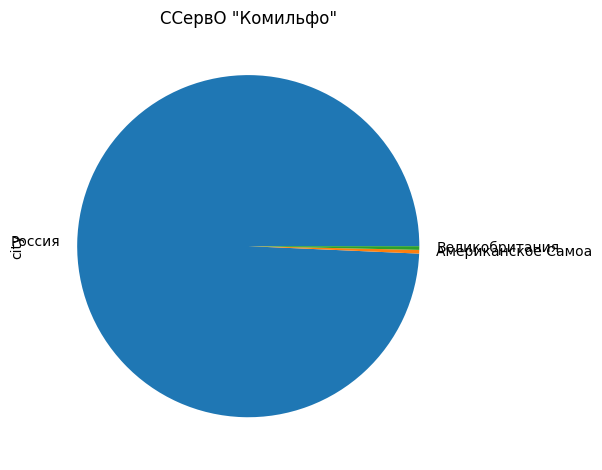

In [7]:
# Распределение подписчиков по странам
print("Распределение подписчиков по странам".center(70))

plt.figure()
irbis_df.groupby('country').city.size().sort_values(ascending=False).head(3).plot(kind='pie', title='ОДП "Ирбис"')
plt.show()
komilfo_df.groupby('country').city.size().sort_values(ascending=False).head(3).plot(kind='pie', title='ССервО "Комильфо"')
plt.tight_layout()
plt.show()

                 Распределение подписчиков по городам                 


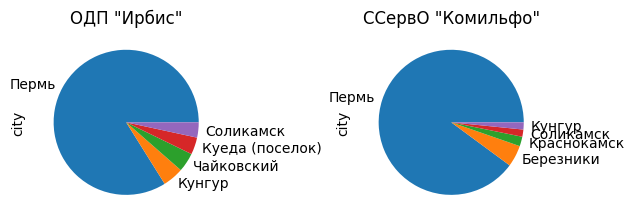

In [8]:
# Распределение подписчиков групп по городам
print("Распределение подписчиков по городам".center(70))

plt.figure()
plt.subplot(1,2,1)
irbis_df.groupby('city').city.size().sort_values(ascending=False).head(5).plot(kind='pie', title='ОДП "Ирбис"')
plt.subplot(1,2,2)
komilfo_df.groupby('city').city.size().sort_values(ascending=False).head(5).plot(kind='pie', title='ССервО "Комильфо"')
plt.tight_layout()
plt.show()

             Распределение подписчиков по статусу онлайн              


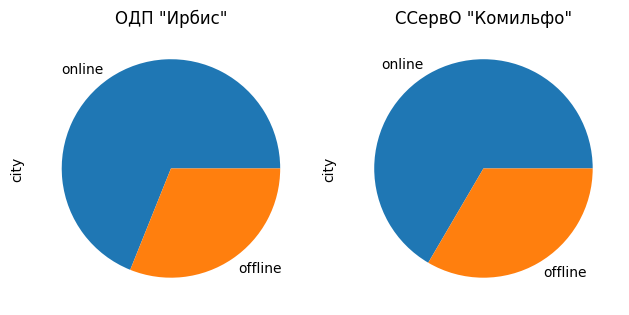

In [9]:
# Распределение подписчиков групп по статусу онлайн
print("Распределение подписчиков по статусу онлайн".center(70))

plt.figure()
plt.subplot(1,2,1)
irbis_df.groupby('status').city.size().sort_values(ascending=False).plot(kind='pie', title='ОДП "Ирбис"')
plt.subplot(1,2,2)
komilfo_df.groupby('status').city.size().sort_values(ascending=False).plot(kind='pie', title='ССервО "Комильфо"')
plt.tight_layout()
plt.show()

In [10]:
print('Пересечение пользователей обеих групп'.center(60))
pd.merge(irbis_df[['first_name', 'last_name', 'age', 'sex', 'city']], komilfo_df[['first_name', 'last_name', 'age', 'sex', 'city']], how='inner')

           Пересечение пользователей обеих групп            


,first_name,last_name,age,sex,city
0,Анастасия,Сосулина,NaN,W,Пермь
1,Анастасия,Добренко,NaN,W,Пермь
2,Алексей,Блюмин,36.0,M,Пермь
3,Дамир,Илькаев,22.0,M,Пермь
4,Руслан,Гимазутдинов,NaN,M,None
...,...,...,...,...,...
73,Алсу,Салимянова,22.0,W,Куеда (поселок)
74,Валерия,Богословская,NaN,W,None
75,Дарья,Широкова,20.0,W,Пермь
76,Катя,Дранишникова,NaN,W,None


In [11]:
print('Пересечение городов подписчиков обеих групп'.center(60))
pd.merge(pd.DataFrame(irbis_df['city'].unique()), pd.DataFrame(komilfo_df['city'].unique()), how='inner')

        Пересечение городов подписчиков обеих групп         


,0
0,Краснокамск
1,Пермь
2,None
3,Екатеринбург
4,Куеда (поселок)
5,Соликамск
6,Барнаул
7,Новокузнецк
8,Нижний Новгород
9,Очер


       Сравнение пользователей обеих групп по статусу "онлайн"        


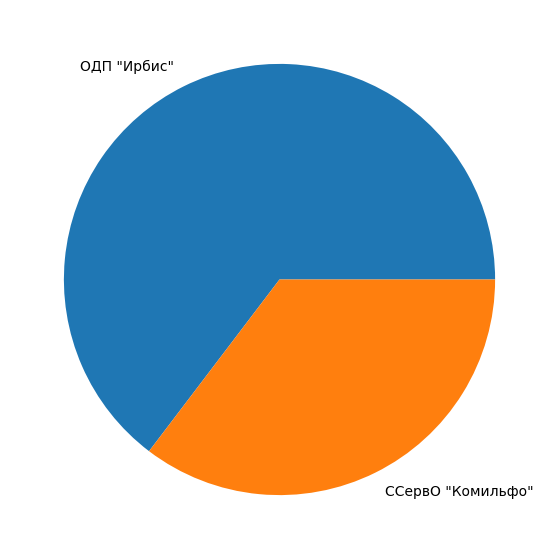

In [12]:
# Сравнение пользователей обеих групп по статусу "онлайн"
print('Сравнение пользователей обеих групп по статусу "онлайн"'.center(70))
fig = plt.figure(figsize =(10, 7))
x = [len(irbis_df[irbis_df['status'] == 'online']), len(komilfo_df[komilfo_df['status'] == 'online'])]
y = ['ОДП "Ирбис"', 'ССервО "Комильфо"']
plt.pie(x, labels = y)
plt.show()

In [13]:
# 3. Граф пользователей. Вершина - пользователь одной из групп, связь - пользователи дружат

# Создание датафреймов пользователей по цветам (красный - пользователи группы # ОДП "Ирбис", сиреневый - ССервО "Комильфо")
irbis_ids = pd.DataFrame({'id': get_ids(raw_irbis_users)})
komilfo_ids = pd.DataFrame({'id': get_ids(raw_komilfo_users)})

users_df = pd.concat([irbis_ids, komilfo_ids], ignore_index=True)

In [14]:
# Генерация ребер (друг-друг)
edges = create_edges(users_df)

100%|██████████| 927/927 [01:21<00:00, 11.43it/s]


Private users: 238


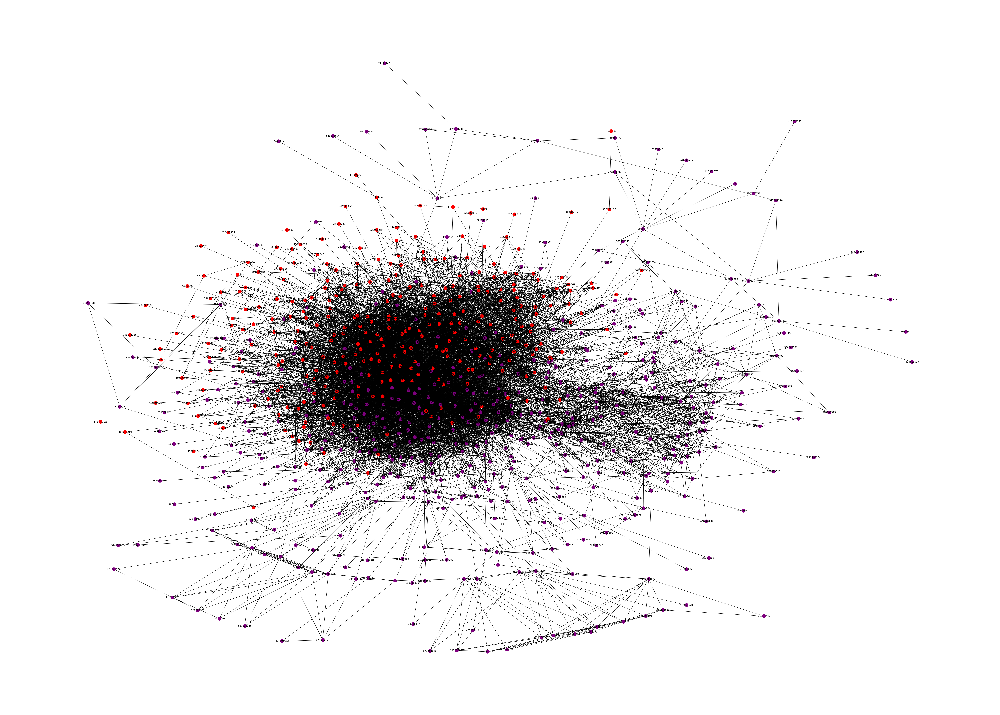

In [15]:
# Визуализация графа
Graph = nx.from_pandas_edgelist(edges, 'first', 'second')
colors = create_colors(Graph, komilfo_ids)
plt.figure(figsize=(70,50))
nx.draw_kamada_kawai(Graph, with_labels=True,node_color=colors)
plt.show()